# NYC Hate Crime Open Data
### by Abu Nayeem

In [1]:
# importing libraries
import pandas as pd
import numpy as np
from sodapy import Socrata
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import urllib.parse
import json
from urllib.request import urlopen
import requests # library to handle requests
from datetime import datetime

## Method 1 to load Regular Data

In [2]:
# Original count 3078
# month column unecessary as I will create time variables

# query parameter as a string
query = """
    SELECT 
        record_create_date as rDate,
        complaint_year_number as year,
        bias_motive_description as bias,
        offense_category as offense_Category,
        law_code_category_description as crime_Category,
        offense_description as offense,
        pd_code_description as description,
        county as borough,
        complaint_precinct_code as precinct,
        patrol_borough_name as borough_add,
        arrest_id       
    WHERE
        bias_motive_description IN ('ANTI-JEWISH','ANTI-MALE HOMOSEXUAL (GAY)',
                                    'ANTI-ASIAN','ANTI-BLACK','ANTI-OTHER ETHNICITY',
                                    'ANTI-WHITE','ANTI-MUSLIM','ANTI-TRANSGENDER',
                                    'ANTI-HISPANIC','ANTI-CATHOLIC','ANTI-FEMALE HOMOSEXUAL (LESBIAN)')
        AND law_code_category_description IN ('FELONY','MISDEMEANOR')
    LIMIT
        10000
    """

url=f'https://data.cityofnewyork.us/resource/bqiq-cu78.json?$query={query}'
data= requests.get(url).json()
df=pd.DataFrame(data)
print(df.shape)
df.head(5)

(2961, 11)


,rDate,year,bias,offense_Category,crime_Category,offense,description,borough,precinct,borough_add,arrest_id
0,2019-12-12T00:00:00.000,2019,ANTI-JEWISH,Unclassified,FELONY,MISCELLANEOUS PENAL LAW,AGGRAVATED HARASSMENT 1,NEW YORK,24,PATROL BORO MAN NORTH,NaN
1,2019-10-07T00:00:00.000,2019,ANTI-JEWISH,Religion/Religious Practice,FELONY,MISCELLANEOUS PENAL LAW,AGGRAVATED HARASSMENT 1,BRONX,41,PATROL BORO BRONX,NaN
2,2019-06-13T00:00:00.000,2019,ANTI-JEWISH,Religion/Religious Practice,FELONY,MISCELLANEOUS PENAL LAW,AGGRAVATED HARASSMENT 1,BRONX,46,PATROL BORO BRONX,NaN
3,2019-09-22T00:00:00.000,2019,ANTI-JEWISH,Religion/Religious Practice,FELONY,MISCELLANEOUS PENAL LAW,AGGRAVATED HARASSMENT 1,BRONX,48,PATROL BORO BRONX,NaN
4,2019-10-21T00:00:00.000,2019,ANTI-JEWISH,Religion/Religious Practice,FELONY,MISCELLANEOUS PENAL LAW,AGGRAVATED HARASSMENT 1,BRONX,48,PATROL BORO BRONX,NaN


In [116]:
####Don't Run

# query parameter as a string
query = """
    SELECT
        bias_motive_description,
        count(*) as Count
    GROUP BY
        bias_motive_description
    HAVING
        Count >30
    ORDER BY
        Count DESC
    LIMIT
        1000
    """

# format values in the url, easier to read
url=f'https://data.cityofnewyork.us/resource/bqiq-cu78.json?$query={query}'
data= requests.get(url).json()
df=pd.DataFrame(data)
print(df.shape)
df.head(5)

%0A++++SELECT%0A++++++++bias_motive_description%2C%0A++++++++count%28%2A%29+as+Count%0A++++GROUP+BY%0A++++++++bias_motive_description%0A++++HAVING%0A++++++++Count+%3E30%0A++++ORDER+BY%0A++++++++Count+DESC%0A++++LIMIT%0A++++++++1000%0A++++
url: https://data.cityofnewyork.us/resource/bqiq-cu78.csv?$query=%0A++++SELECT%0A++++++++bias_motive_description%2C%0A++++++++count%28%2A%29+as+Count%0A++++GROUP+BY%0A++++++++bias_motive_description%0A++++HAVING%0A++++++++Count+%3E30%0A++++ORDER+BY%0A++++++++Count+DESC%0A++++LIMIT%0A++++++++1000%0A++++
(11, 2)


,bias_motive_description,Count
0,ANTI-JEWISH,1419
1,ANTI-MALE HOMOSEXUAL (GAY),394
2,ANTI-ASIAN,348
3,ANTI-BLACK,241
4,ANTI-OTHER ETHNICITY,127
5,ANTI-WHITE,108
6,ANTI-MUSLIM,103
7,ANTI-TRANSGENDER,76
8,ANTI-HISPANIC,75
9,ANTI-CATHOLIC,56


In [5]:
# Fix up and rename values

#bias; Need remove "anti-", letter case, and change some values
df.bias=df.bias.str.replace('ANTI-','').str.title()
# Single Function action
def Bias(x):
    if x =='Male Homosexual (Gay)':
        return 'Gay'
    elif x =='Female Homosexual (Lesbian)':
        return 'Lesbian'
    else:
        return x

df.bias= df.bias.apply(Bias) #apply function

# Borough renaming
df.borough=df.borough.str.title()
def Borough(x):
    if x =='Kings':
        return 'Brooklyn'
    elif x =='Richmond':
        return 'Staten'
    if x =='New York':
        return 'Manhattan'
    else:
        return x

df.borough= df.borough.apply(Borough) #apply function

# Borugh_Add
df.borough_add=df.borough_add.str.replace('Patrol Boro ','').str.title() 
df.borough_add=df.borough_add.str.replace(' Island','')#,inplace=True)
df.borough_add=df.borough_add.str.replace(' South','_S')#,inplace=True)
df.borough_add=df.borough_add.str.replace(' North','_N')#,inplace=True)

df.crime_Category=df.crime_Category.str.title() #this column with not be used
df.offense=df.offense.str.title() # greater than 20 count be used
df.description=df.description.str.title() #this column will not be used

#DateTime Variables
df['dateTime']= pd.to_datetime(df['rDate']) # Create new column called DateTime
df['dayofWeek']=df['dateTime'].dt.dayofweek #create day of the week column where default 0=Monday
df['weekend'] = df['dayofWeek'].apply(lambda x: 1 if (x>4)  else 0) #Create a weekend category
df['month'] = df['dateTime'].dt.month # Create Month Category
df['day'] = df['dateTime'].dt.day #Create Day of the Current month
df['dayYear'] = df['dateTime'].dt.dayofyear  #Create Day of the year (0-365)

def date_to_dayofyear(date_str):
    """Converts a date string to the day of the year."""

    date_obj = datetime.strptime(date_str, '%Y-%m-%d')
    return date_obj.timetuple().tm_yday

# Example usage
date_str = "2024-09-12"
day_of_year = date_to_dayofyear(date_str)
df['toDate']= date_to_dayofyear(date_str)

#binning time by month
def Month_bin(year,month):
    if year=='2020':
        return 12 + month
    elif year=='2021':
        return 24 +month
    elif year=='2022':
        return 36 +month
    elif year=='2023':
        return 48 +month
    elif year=='2024':
        return 60 +month
    else:
        return month

df['month_bin']= df.apply(lambda y: Month_bin(y.year, y.month), axis=1)


# Shorten Offenses to a new table
def offense1(x):
    if x=="Assault 3 & Related Offenses":
        return "Assault"
    elif x=="Criminal Mischief & Related Of":
        return "Criminal Mischief"
    elif x in ["Felony Assault","Grand Larceny","Robbery"]:
        return x
    elif x=="Off. Agnst Pub Ord Sensblty &":
        return "Agst Public Order"
    elif x=="Miscellaneous Penal Law":
        return "Misc. Penal Law"
    else:
        return "Other"

df['offense1']=df.offense.apply(offense1)

#Create Index
df['index_']=1
df.tail(5)



,rDate,year,bias,offense_Category,crime_Category,offense,description,borough,precinct,borough_add,arrest_id,dateTime,dayofWeek,weekend,month,day,dayYear,toDate,month_bin,index_
2956,2024-03-09T00:00:00.000,2024,Asian,Race/Color,Misdemeanor,Assault 3 & Related Offenses,Assault 3,Manhattan,14,Patrol Boro Man_S,M36684260,2024-03-09,5,1,3,9,69,256,63,1
2957,2024-03-09T00:00:00.000,2024,Asian,Race/Color,Misdemeanor,Assault 3 & Related Offenses,Assault 3,Manhattan,14,Patrol Boro Man_S,M36684674,2024-03-09,5,1,3,9,69,256,63,1
2958,2024-03-09T00:00:00.000,2024,Asian,Race/Color,Misdemeanor,Assault 3 & Related Offenses,Assault 3,Manhattan,14,Patrol Boro Man_S,M36684675,2024-03-09,5,1,3,9,69,256,63,1
2959,2024-01-08T00:00:00.000,2024,Jewish,Religion/Religious Practice,Misdemeanor,Assault 3 & Related Offenses,Assault 3,Manhattan,17,Patrol Boro Man_S,M36673135,2024-01-08,0,0,1,8,8,256,61,1
2960,2024-01-29T00:00:00.000,2024,Jewish,Religion/Religious Practice,Misdemeanor,Assault 3 & Related Offenses,Assault 3,Manhattan,18,Patrol Boro Man_S,M36694620,2024-01-29,0,0,1,29,29,256,61,1


In [7]:
#Import Libraries & Load Data
import plotly.express as xp   # now it works
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import HTML
from IPython.display import display
import requests # library to handle requests
import folium
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
from IPython.display import Audio

In [289]:
#Graphing using seaborn
sns.set_style("darkgrid") #white, white-grid, ticks

ax= sns.kdeplot(MS1.query('licensedUnits<5').YearBuilt, label='Units <5')
sns.kdeplot(MS1.query('(licensedUnits> 4) and (licensedUnits< 25)').YearBuilt, label='Units 5-24')
sns.kdeplot(MS1.query('licensedUnits>24').YearBuilt, label='Units >24')


ax.set_title('2022 Minneapolis Active Rental YearBuilt Distribution by Licensed Units')
plt.xlabel('Year Built', fontsize=12)

259
2024-09-15 08:04:23.703994


,rDate,year,bias,offense_Category,crime_Category,offense,description,borough,precinct,borough_add,arrest_id,dateTime,dayofWeek,weekend,month,day,dayYear,toDate
0,2019-12-12T00:00:00.000,2019,Jewish,Unclassified,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Manhattan,24,Man_N,NaN,2019-12-12,3,0,12,12,346,254
1,2019-10-07T00:00:00.000,2019,Jewish,Religion/Religious Practice,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Bronx,41,Bronx,NaN,2019-10-07,0,0,10,7,280,254
2,2019-06-13T00:00:00.000,2019,Jewish,Religion/Religious Practice,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Bronx,46,Bronx,NaN,2019-06-13,3,0,6,13,164,254
3,2019-09-22T00:00:00.000,2019,Jewish,Religion/Religious Practice,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Bronx,48,Bronx,NaN,2019-09-22,6,1,9,22,265,254
4,2019-10-21T00:00:00.000,2019,Jewish,Religion/Religious Practice,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Bronx,48,Bronx,NaN,2019-10-21,0,0,10,21,294,254


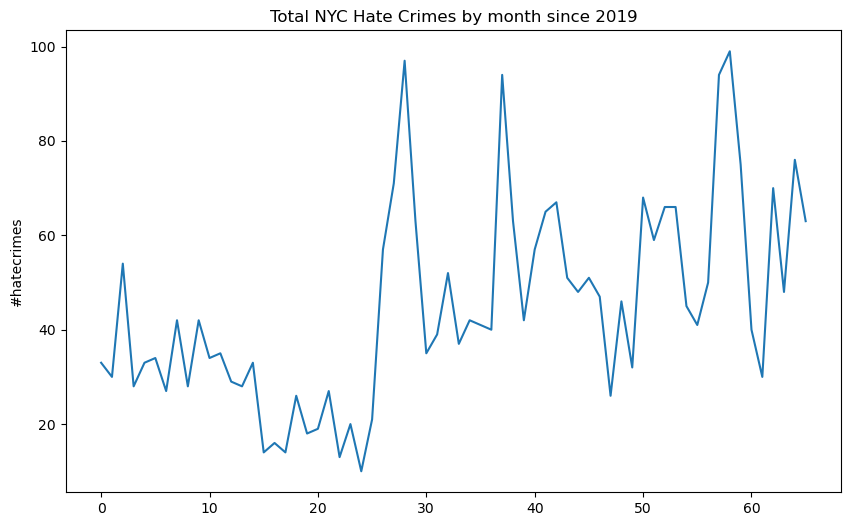

In [347]:
#p1=['month_bin','borough_add','index_']
#df[p].groupby(['month_bin','borough_add']).sum().reset_index()

p1=['month_bin','index_']
pf=df[p1].groupby(['month_bin']).sum().reset_index()
pf.columns=['date','#hatecrimes']
#pf.set_index('date')

#p1=['month_bin','borough_add','index_']
#df[p].groupby(['month_bin','borough_add']).sum().reset_index()

# Set the width and height of the figure
plt.figure(figsize=(10,6))

# Add title
plt.title("Total NYC Hate Crimes by month since 2019")

#col= ['2015_SP_Council', '2016_SP_Pres', '2017_Mpls_Council',  '2017_SP_Mayor','2018_SP_Senate']

bg=sns.lineplot(pf['#hatecrimes'])

# Add label for horizontal axis
plt.xlabel("")

figure = bg.get_figure() 

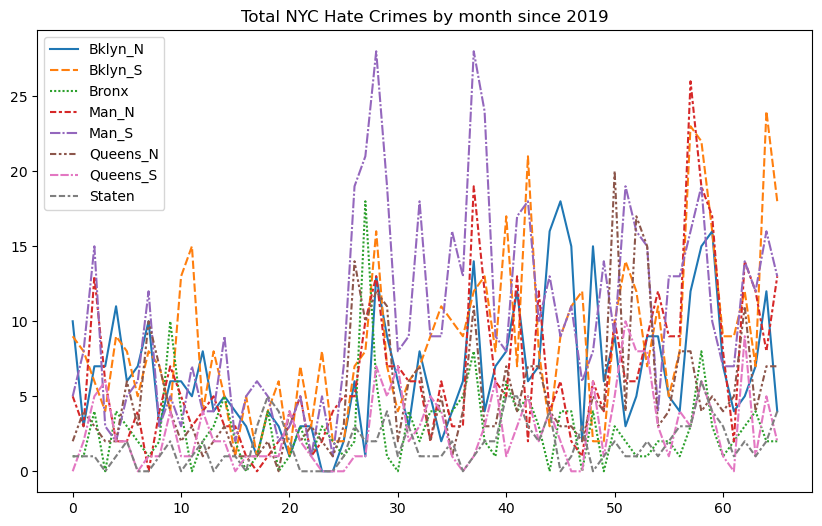

In [387]:
p2=['month_bin','borough_add','index_']
pv=df[p2].groupby(['month_bin','borough_add']).sum().reset_index()
pv1=pd.pivot_table(pv,index='month_bin', columns='borough_add', values=['index_']).reset_index().fillna(0)
pv1.columns= ['month','Bklyn_N','Bklyn_S','Bronx','Man_N','Man_S','Queens_N','Queens_S','Staten']

# Set the width and height of the figure
plt.figure(figsize=(10,6))

# Add title
plt.title("Total NYC Hate Crimes by month since 2019")

col= ['Bklyn_N','Bklyn_S','Bronx','Man_N','Man_S','Queens_N','Queens_S','Staten']

bg=sns.lineplot(pv1[col])

# Add label for horizontal axis
plt.xlabel("")

figure = bg.get_figure() 


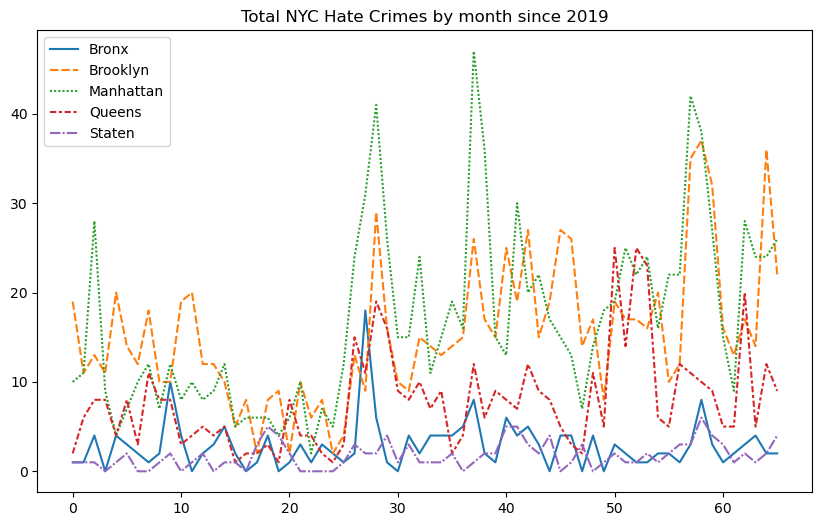

In [391]:
p2=['month_bin','borough','index_']
pv=df[p2].groupby(['month_bin','borough']).sum().reset_index()
pv1=pd.pivot_table(pv,index='month_bin', columns='borough', values=['index_']).reset_index().fillna(0)
pv1

pv1.columns= ['month','Bronx','Brooklyn','Manhattan','Queens','Staten']

# Set the width and height of the figure
plt.figure(figsize=(10,6))

# Add title
plt.title("Total NYC Hate Crimes by month since 2019")

col= ['Bronx','Brooklyn','Manhattan','Queens','Staten']

bg=sns.lineplot(pv1[col])

# Add label for horizontal axis
plt.xlabel("")

figure = bg.get_figure() 


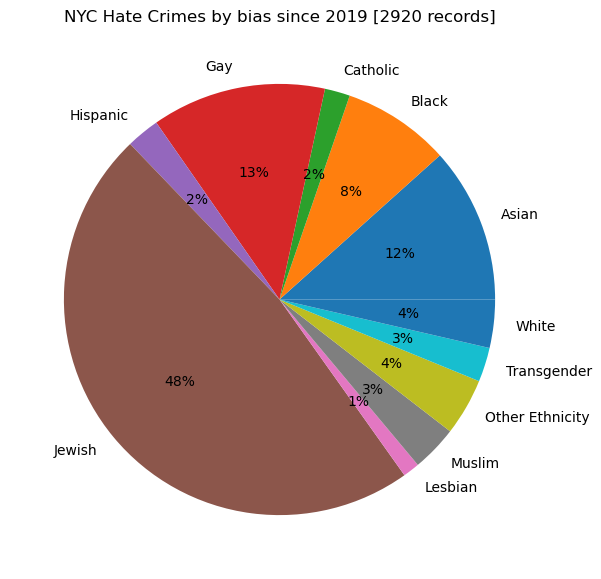

In [415]:
# Creating plt pie plot
p2=['bias','index_']
gf=df[p2].groupby(['bias']).sum().reset_index()
gf.columns=['bias','Count']

fig = plt.figure(figsize=(10, 7))
plt.pie(gf.Count, labels=gf.bias, autopct='%1.0f%%')
plt.title("NYC Hate Crimes by bias since 2019 [2920 records]")
# show plot
plt.show()

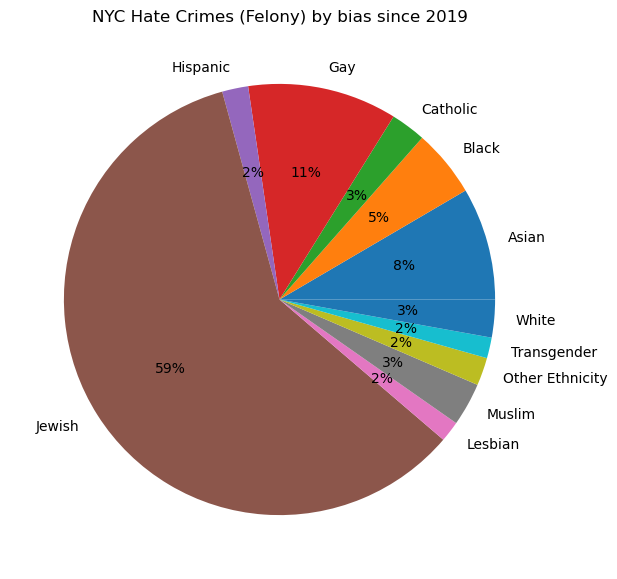

In [421]:
# Creating plt pie plot with specify crime

df1=df.query('crime_Category=="Felony"')
p2=['bias','index_']
gf=df1[p2].groupby(['bias']).sum().reset_index()
gf.columns=['bias','Count']

fig = plt.figure(figsize=(10, 7))
plt.pie(gf.Count, labels=gf.bias, autopct='%1.0f%%')
plt.title("NYC Hate Crimes (Felony) by bias since 2019")
# show plot
plt.show()

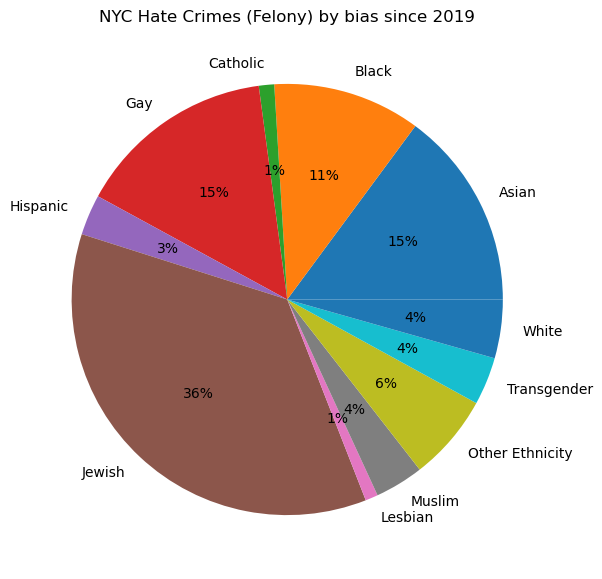

In [423]:
# Creating plt pie plot with specify crime

df1=df.query('crime_Category=="Misdemeanor"')
p2=['bias','index_']
gf=df1[p2].groupby(['bias']).sum().reset_index()
gf.columns=['bias','Count']

fig = plt.figure(figsize=(10, 7))
plt.pie(gf.Count, labels=gf.bias, autopct='%1.0f%%')
plt.title("NYC Hate Crimes (Felony) by bias since 2019")
# show plot
plt.show()

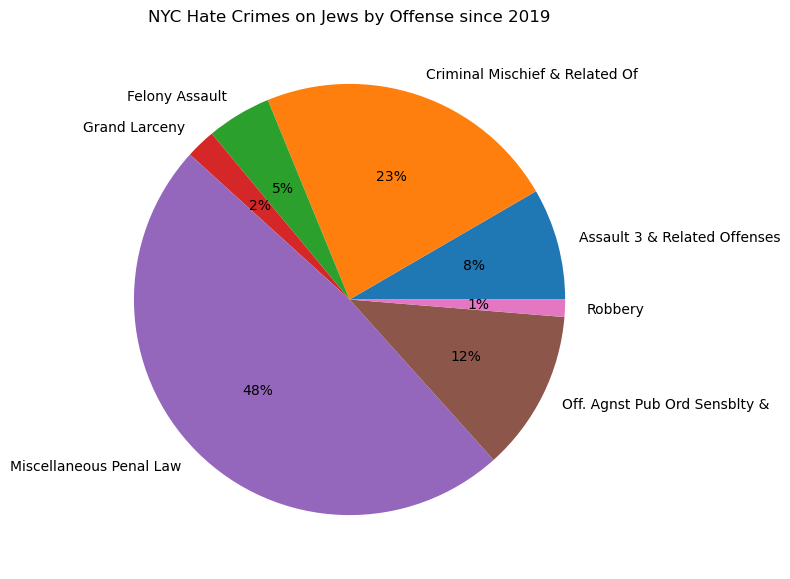

In [9]:
# Creating plt pie plot with specify crime

df1=df.query('bias=="Jewish"')
p2=['offense','index_']
gf=df1[p2].groupby(['offense']).sum().reset_index()
gf.columns=['offense','Count']
gf=gf.query('Count>15')

fig = plt.figure(figsize=(10, 7))
plt.pie(gf.Count, labels=gf.offense, autopct='%1.0f%%')
plt.title("NYC Hate Crimes on Jews by Offense since 2019")
# show plot
plt.show()

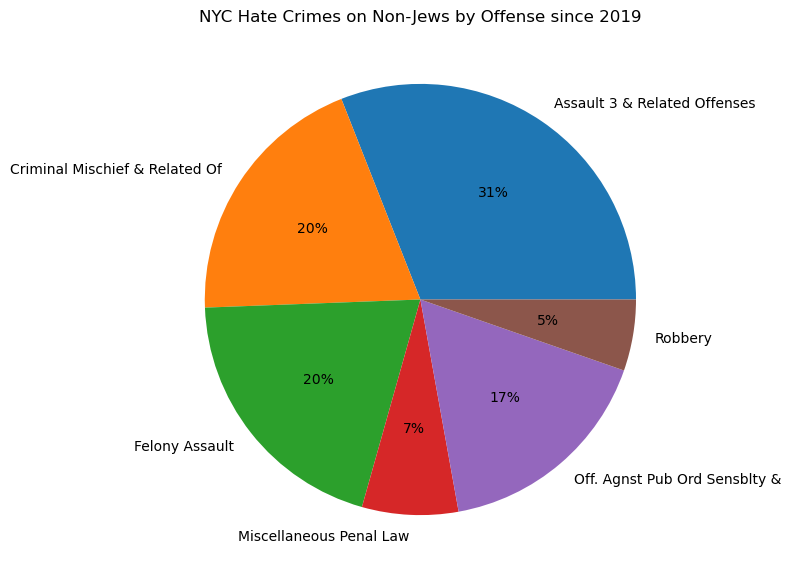

In [13]:
# Creating plt pie plot with specify crime

df1=df.query('bias!="Jewish"')
p2=['offense','index_']
gf=df1[p2].groupby(['offense']).sum().reset_index()
gf.columns=['offense','Count']
gf=gf.query('Count>15')

fig = plt.figure(figsize=(10, 7))
plt.pie(gf.Count, labels=gf.offense, autopct='%1.0f%%')
plt.title("NYC Hate Crimes on Non-Jews by Offense since 2019")
# show plot
plt.show()

In [ ]:
# 

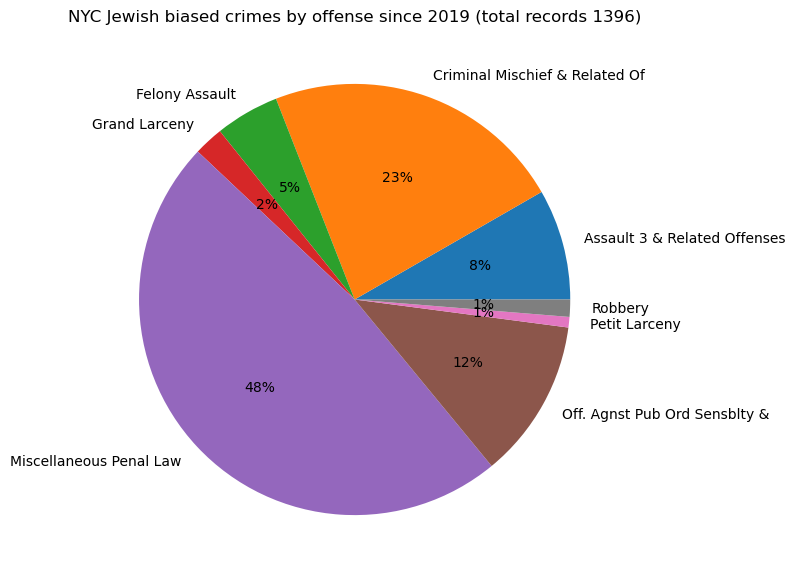

In [479]:
# Creating plt pie plot with specify crime

def pie_bias_Offenseplot(Var1,Count):
    df1=df[(df['bias'] == Var1)]
    p2=['offense','index_']
    gf=df1[p2].groupby(['offense']).sum().reset_index()
    gf.columns=['offense','Count']
    gf=gf[(gf['Count'] > Count)]
    Total = gf.Count.sum()
    fig = plt.figure(figsize=(10, 7))
    plt.pie(gf.Count, labels=gf.offense, autopct='%1.0f%%')
    plt.title('NYC {} biased crimes by offense since 2019 (total records {})'.format(Var1,Total))
    plt.xlabel('')
    return plt.show() 

pie_bias_Offenseplot('Jewish',10)

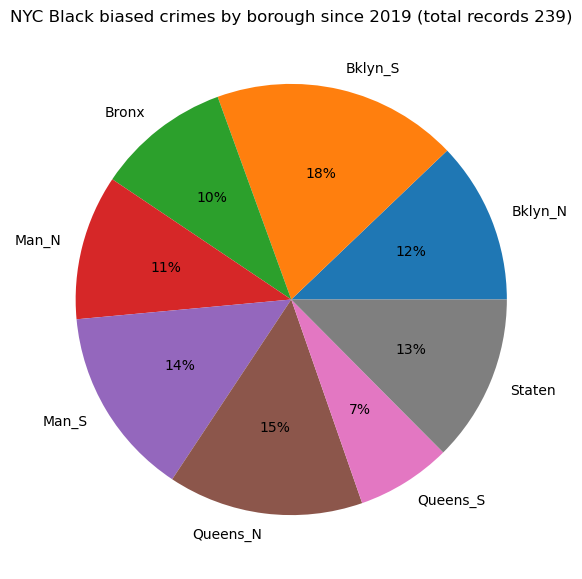

In [475]:
# Creating plt pie plot with specify crime

def pie_bias_boroughplot(Var1,Count):
    df1=df[(df['bias'] == Var1)]
    p2=['borough_add','index_']
    gf=df1[p2].groupby(['borough_add']).sum().reset_index()
    gf.columns=['borough_add','Count']
    gf=gf[(gf['Count'] > Count)]
    Total = gf.Count.sum()
    fig = plt.figure(figsize=(10, 7))
    plt.pie(gf.Count, labels=gf.borough_add, autopct='%1.0f%%')
    plt.title('NYC {} biased crimes by borough since 2019 (total records {})'.format(Var1,Total))
    plt.xlabel('')
    return plt.show() 

pie_bias_boroughplot('Black',5)

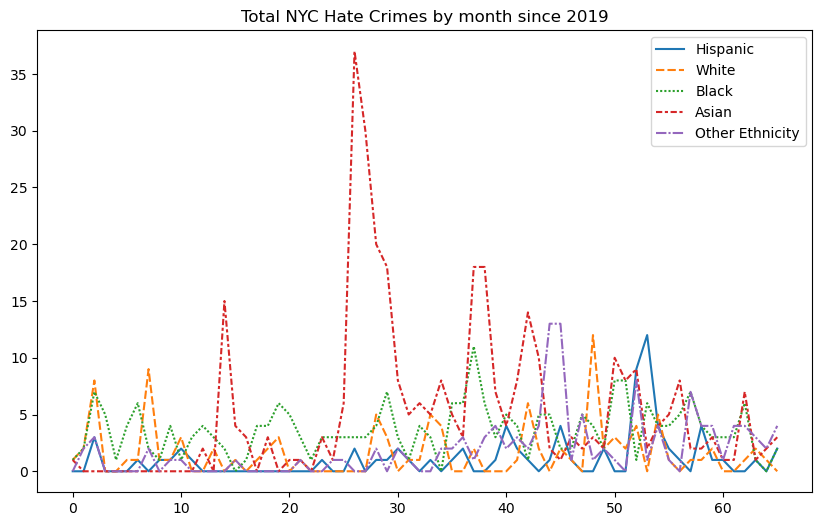

In [407]:
p2=['month_bin','bias','index_']
pv=df[p2].groupby(['month_bin','bias']).sum().reset_index()
pv1=pd.pivot_table(pv,index='month_bin', columns='bias', values=['index_']).reset_index().fillna(0)
pv1

pv1.columns= ['month','Asian','Black','Catholic','Gay','Hispanic','Jewish','Lesbian','Muslim',\
              'Other Ethnicity','Transgender','White']

# Set the width and height of the figure
plt.figure(figsize=(10,6))

# Add title
plt.title("Total NYC Hate Crimes by month since 2019")

col= ['Hispanic','White','Black','Asian','Other Ethnicity']

bg=sns.lineplot(pv1[col])

# Add label for horizontal axis
plt.xlabel("")

figure = bg.get_figure() 

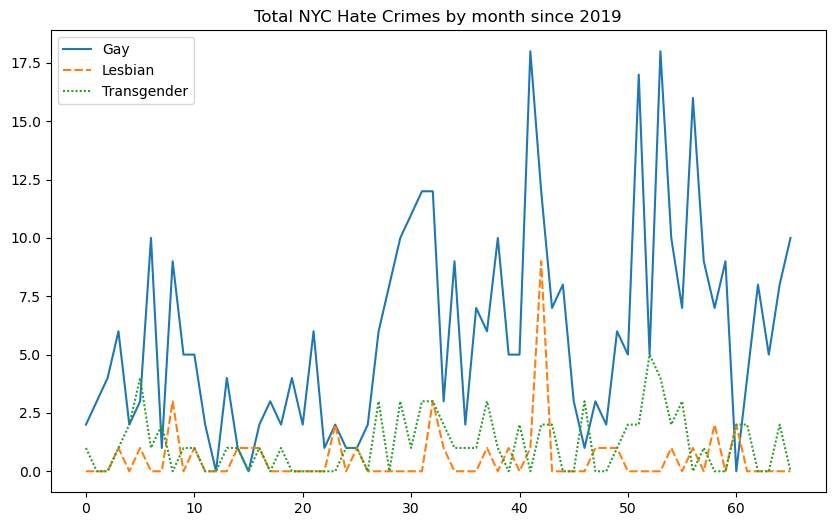

In [409]:
# Set the width and height of the figure
plt.figure(figsize=(10,6))

# Add title
plt.title("Total NYC Hate Crimes by month since 2019")
col= ['Gay','Lesbian','Transgender']

bg=sns.lineplot(pv1[col])

# Add label for horizontal axis
plt.xlabel("")

figure = bg.get_figure() 

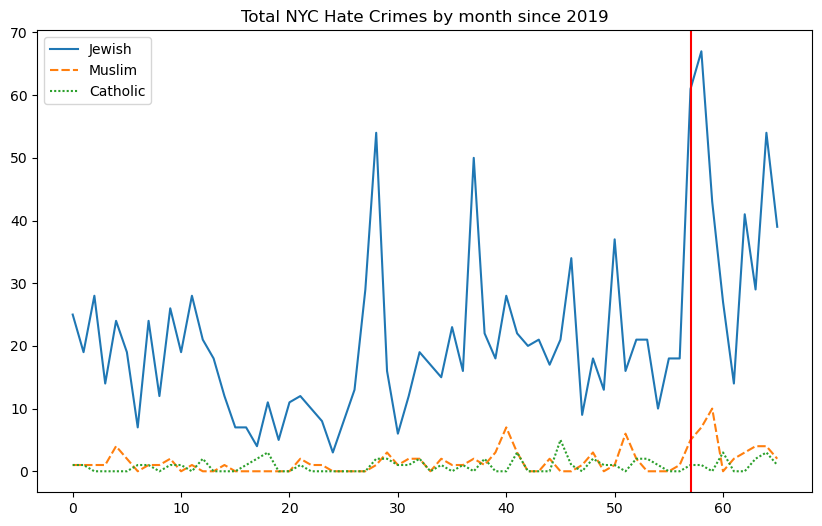

In [441]:
# Set the width and height of the figure
plt.figure(figsize=(10,6))

# Add title
plt.title("Total NYC Hate Crimes by month since 2019")
col= ['Jewish','Muslim','Catholic']

bg=sns.lineplot(pv1[col])

# Add label for horizontal axis
plt.xlabel("")
plt.axvline(x=57, color='r')

figure = bg.get_figure() 

## Mapping

We will be using precinct as the geo-coordinate. It was retrived here {here}. I will be using two graphing methods

In [25]:
#Import Libraries & Load Data
import plotly.express as xp   # now it works
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import HTML
from IPython.display import display
import requests # library to handle requests
import folium
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import geopandas
import JSON

precinct_geo = r'Shapefiles_JSON/nyc-police-precincts.geojson'

data = requests.get(
    "https://raw.githubusercontent.com/python-visualization/folium-example-data/main/us_states.json"
).json()
states = geopandas.GeoDataFrame.from_features(data)#, crs="EPSG:4326")

states.head()

#map1 = geopandas.GeoDataFrame.from_features(precinct_geo)

#map1.head()

In [ ]:
##

In [155]:
import folium  # Make sure to import folium

# Prepare data
def choro_bias_map(Var1='All'):
    if Var1 == 'All':
        mf = df
    else:
        mf = df[(df['bias'] == Var1)]
    
    p = ['precinct', 'index_']
    mf = mf[p].groupby(['precinct']).sum().reset_index().fillna(0)
    mf.columns = ['precinct1', 'Count']
    
    # Choropleth Map
    NYC_map = folium.Map(location=[40.7128466, -73.9138168], zoom_start=11.25, tiles="OpenStreetMap")

    # Use folium.Choropleth instead of NYC_map.choropleth
    folium.Choropleth(
        geo_data=precinct_geo,
        data=mf,
        columns=['precinct1', 'Count'],
        key_on="feature.properties.precinct",
        fill_color='YlOrRd', 
        fill_opacity=0.7, 
        line_opacity=0.2,
        legend_name='2020 Saint Paul Ballot',
        nan_fill_color="gray",
        nan_fill_opacity=0.4,
        highlight=True
    ).add_to(NYC_map)  # Add the choropleth layer to the map


    return NYC_map                      

choro_bias_map()


In [187]:
choro_bias_map('Muslim')

In [53]:
data = requests.get(
    "https://raw.githubusercontent.com/python-visualization/folium-example-data/main/us_states.json"
).json()
states = geopandas.GeoDataFrame.from_features(data)#, crs="EPSG:4326")

states.head()
print(type(data))
print(type(states))
#import json

#with open('Shapefiles_JSON/nyc-police-precincts.geojson', 'r') as f:
#    geojson_data = json.load(f)

#print(geojson_data)

#precinct_geo = r'Shapefiles_JSON/nyc-police-precincts.geojson'

#map = geopandas.GeoDataFrame.from_features(precinct_geo)
#map1=requests.get(precinct_geo).json()
#dr = geopandas.GeoDataFrame.from_features(map1)#, crs="EPSG:4326")


#map1

<class 'dict'>
<class 'geopandas.geodataframe.GeoDataFrame'>


In [147]:
import json

# Open the GeoJSON file and load it into a dictionary
with open('nyc-police-precincts.geojson', 'r') as f:
    geojson_data = json.load(f)

# Check the type of the loaded data
print(type(geojson_data)) 

state= geopandas.GeoDataFrame.from_features(geojson_data, crs="EPSG:4326")
d=['geometry','precinct']
state= state[d]
print(type(state))

# Get Total by Precinct
p=['precinct','index_']
d=['geometry','precinct']
df1=df[p].groupby(['precinct']).sum().reset_index()
df1.columns=['precinct','total']
A=pd.merge(state[d], df1, on='precinct', how='right') 

# Get Total by offense
# Get Total by Offense1
p2=['precinct','offense1','index_']
pv=df[p2].groupby(['precinct','offense1']).sum().reset_index()
pv2=pd.pivot_table(pv,index='precinct', columns='offense1', values=['index_']).reset_index().fillna(0)
pv2.columns= ['precinct','Agst Public Order','Assault(Minor)','Criminal Mischief','Felony Assault','Grand Larceny','Misc. Penal Law','Other','Robbery']
B= pd.merge(A, pv2, on='precinct', how='right') 


# Get Total by Bias
p2=['precinct','bias','index_']
pv=df[p2].groupby(['precinct','bias']).sum().reset_index()
pv2=pd.pivot_table(pv,index='precinct', columns='bias', values=['index_']).reset_index().fillna(0)
pv2.columns= ['precinct','Asian','Black','Catholic','Gay','Hispanic','Jewish','Lesbian','Muslim','Other Ethnicity','Transgender','White']

geomerge= pd.merge(B, pv2, on='precinct', how='right') 
geomerge.head(5) 



<class 'dict'>
<class 'geopandas.geodataframe.GeoDataFrame'>


,geometry,precinct,total,Agst Public Order,Assault(Minor),Criminal Mischief,Felony Assault,Grand Larceny,Misc. Penal Law,Other,...,Black,Catholic,Gay,Hispanic,Jewish,Lesbian,Muslim,Other Ethnicity,Transgender,White
0,"MULTIPOLYGON (((-74.04388 40.69019, -74.04351 ...",1,78,11.0,8.0,17.0,6.0,0.0,32.0,4.0,...,6.0,0.0,10.0,2.0,45.0,1.0,1.0,1.0,0.0,3.0
1,"MULTIPOLYGON (((-74.00139 40.76285, -74.00051 ...",10,74,9.0,16.0,15.0,16.0,0.0,16.0,1.0,...,9.0,5.0,23.0,3.0,16.0,0.0,0.0,6.0,3.0,2.0
2,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ...",100,15,3.0,2.0,6.0,1.0,0.0,3.0,0.0,...,3.0,1.0,2.0,0.0,6.0,0.0,1.0,2.0,0.0,0.0
3,"MULTIPOLYGON (((-73.76669 40.61425, -73.76665 ...",101,24,3.0,7.0,3.0,4.0,0.0,6.0,1.0,...,1.0,0.0,2.0,2.0,16.0,0.0,0.0,0.0,1.0,0.0
4,"MULTIPOLYGON (((-73.81710 40.70403, -73.81683 ...",102,24,4.0,2.0,4.0,6.0,0.0,8.0,0.0,...,1.0,0.0,2.0,1.0,10.0,0.0,2.0,0.0,0.0,8.0


In [103]:
from branca.colormap import linear

colormap = linear.YlGn_09.scale(
    geomerge.total.min(), geomerge.total.max()
)

print(colormap(5.0))

#geomerge.total

#YlOrRd
colormap

#ffffe2ff


In [117]:
import branca

colormap = branca.colormap.LinearColormap(
    vmin=geomerge["total"].quantile(0.0),
    vmax=geomerge["total"].quantile(1),
    colors=["white", "pink", "orange", "red", "darkred"],
    caption="NYC Hate Crimes Map by bias since 2019 ",
)

colormap

In [153]:
import folium  # Make sure to import folium
import branca

colormap = branca.colormap.LinearColormap(
    vmin=geomerge["total"].quantile(0.0),
    vmax=geomerge["total"].quantile(1),
    colors=["white", "pink", "orange", "red", "darkred"],
    caption="NYC Hate Crimes Map by bias since 2019 ",
)

NYC_map = folium.Map(location=[40.7128466, -73.9138168], zoom_start=11.25, tiles="OpenStreetMap")

popup = folium.GeoJsonPopup(
    fields=['total','Agst Public Order','Assault(Minor)','Criminal Mischief','Felony Assault','Grand Larceny','Misc. Penal Law','Other','Robbery'],
    #aliases=["State", "% Change"],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)

tooltip = folium.GeoJsonTooltip(
    fields=['precinct','Asian','Black','Catholic','Gay','Hispanic','Jewish','Lesbian','Muslim','Other Ethnicity','Transgender','White'],
    #aliases=["State:", "2015 Median Income(USD):", "Median % Change:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 1px solid black;
        border-radius: 1px;
        box-shadow: 1px;
    """,
    max_width=800,
)

g = folium.GeoJson(
    geomerge,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["total"])
        if x["properties"]["total"] is not None
        else "transparent",
        "color": "black",
        "weight":1.5, #set thickness
        "fillOpacity": 0.4,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(NYC_map)

colormap.add_to(NYC_map)

NYC_map



In [ ]:
import folium  # Make sure to import folium

NYC_map = folium.Map(location=[40.7128466, -73.9138168], zoom_start=11.25, tiles="OpenStreetMap")

popup = folium.GeoJsonPopup(
    fields=['total','Agst Public Order','Assault(Minor)','Criminal Mischief','Felony Assault','Grand Larceny','Misc. Penal Law','Other','Robbery'],
    #aliases=["State", "% Change"],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)

tooltip = folium.GeoJsonTooltip(
    fields=['precinct','Asian','Black','Catholic','Gay','Hispanic','Jewish','Lesbian','Muslim','Other Ethnicity','Transgender','White'],
    #aliases=["State:", "2015 Median Income(USD):", "Median % Change:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 1px solid black;
        border-radius: 1px;
        box-shadow: 1px;
    """,
    max_width=800,
)

g = folium.GeoJson(
    geomerge,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["total"])
        if x["properties"]["total"] is not None
        else "transparent",
        "color": "black",
        "fillOpacity": 0.4,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(NYC_map)

colormap.add_to(NYC_map)

NYC_map



In [185]:

def Geo_Bias_OffenseMap(Var1='All'):
    if Var1=='All':
        mf=df
    else:
        mf = df[(df['bias'] == Var1)]

    #geopanda item
    state1= state
    NYC_map = folium.Map(location=[40.7128466, -73.9138168], zoom_start=11.25, tiles="OpenStreetMap")
    # Get Total by Precinct
    p=['precinct','index_']
    df1=mf[p].groupby(['precinct']).sum().reset_index()
    df1.columns=['precinct','total']
    A=pd.merge(state1, df1, on='precinct', how='right') 

    # Get Total by Offense1
    p2=['precinct','offense1','index_']
    pv=mf[p2].groupby(['precinct','offense1']).sum().reset_index()
    pv2=pd.pivot_table(pv,index='precinct', columns='offense1', values=['index_']).reset_index().fillna(0)
    pv2.columns= ['precinct','Agst Public Order','Assault(Minor)','Criminal Mischief','Felony Assault','Grand Larceny','Misc. Penal Law','Other','Robbery']
    geomerge= pd.merge(A, pv2, on='precinct', how='right') 

    colormap = branca.colormap.LinearColormap(
    vmin=geomerge["total"].quantile(0.0),
    vmax=geomerge["total"].quantile(1),
    colors=["white", "pink", "orange", "red", "darkred"],
    caption=("{} Bias NYC Hate Crimes Map by offense since 2019".format(Var1)),
    )

    tooltip = folium.GeoJsonTooltip(
        fields=['precinct','total','Agst Public Order','Assault(Minor)','Criminal Mischief','Felony Assault','Grand Larceny','Misc. Penal Law','Other','Robbery'],
        #aliases=["State:", "2015 Median Income(USD):", "Median % Change:"],
        localize=True,
        sticky=False,
        labels=True,
        style="""
            background-color: #F0EFEF;
            border: 1px solid black;
            border-radius: 1px;
            box-shadow: 1px;
        """,
        max_width=800,
    )

    g = folium.GeoJson(
        geomerge,
        style_function=lambda x: {
            "fillColor": colormap(x["properties"]["total"])
            if x["properties"]["total"] is not None
            else "transparent",
            "weight":1.5, #set thickness
            "color": "black",
            "fillOpacity": 0.6,
        },
        tooltip=tooltip,
        #popup=popup,
    ).add_to(NYC_map)
    colormap.add_to(NYC_map)
    return NYC_map

Geo_Bias_OffenseMap('Asian')

In [181]:
Geo_Bias_OffenseMap('Jewish')

In [145]:
#test Setup
p2=['offense','index_']
pv=df[p2].groupby(['offense']).sum().reset_index()
pv.columns=['offense','count']
pv.query('count>20')

# Shorten Offenses
def offense1(x):
    if x=="Assault 3 & Related Offenses":
        return "Assault(Minor)"
    elif x=="Criminal Mischief & Related Of":
        return "Criminal Mischief"
    elif x in ["Felony Assault","Grand Larceny","Robbery"]:
        return x
    elif x=="Off. Agnst Pub Ord Sensblty &":
        return "Agst Public Order"
    elif x=="Miscellaneous Penal Law":
        return "Misc. Penal Law"
    else:
        return "Other"

df['offense1']=df.offense.apply(offense1)

# Get Total by Offense1
p2=['precinct','offense1','index_']
pv=df[p2].groupby(['precinct','offense1']).sum().reset_index()
pv2=pd.pivot_table(pv,index='precinct', columns='offense1', values=['index_']).reset_index().fillna(0)
pv2.columns= ['precinct','Agst Public Order','Assault(Minor)','Criminal Mischief','Felony Assault','Grand Larceny','Misc. Penal Law','Other','Robbery']

pv2

,precinct,Agst Public Order,Assault(Minor),Criminal Mischief,Felony Assault,Grand Larceny,Misc. Penal Law,Other,Robbery
0,1,11.0,8.0,17.0,6.0,0.0,32.0,4.0,0.0
1,10,9.0,16.0,15.0,16.0,0.0,16.0,1.0,1.0
2,100,3.0,2.0,6.0,1.0,0.0,3.0,0.0,0.0
3,101,3.0,7.0,3.0,4.0,0.0,6.0,1.0,0.0
4,102,4.0,2.0,4.0,6.0,0.0,8.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
72,84,12.0,14.0,13.0,11.0,0.0,16.0,1.0,4.0
73,88,4.0,3.0,4.0,8.0,0.0,8.0,1.0,2.0
74,9,2.0,14.0,6.0,5.0,1.0,2.0,0.0,1.0
75,90,22.0,28.0,10.0,21.0,5.0,22.0,6.0,0.0


In [159]:
state= geopandas.GeoDataFrame.from_features(geojson_data, crs="EPSG:4326")
d=['geometry','precinct']
state= state[d]
print(type(state))


<class 'geopandas.geodataframe.GeoDataFrame'>


In [417]:
df.offense.value_counts()
#df.patrol.str[-5:]

offense
Miscellaneous Penal Law           778
Criminal Mischief & Related Of    610
Assault 3 & Related Offenses      580
Off. Agnst Pub Ord Sensblty &     419
Felony Assault                    367
Robbery                            98
Grand Larceny                      39
Petit Larceny                      19
Sex Crimes                         14
Burglary                           10
Murder & Non-Negl. Manslaughte      6
Dangerous Weapons                   5
Offenses Against The Person         3
Arson                               3
Criminal Trespass                   2
Homicide-Negligent,Unclassifie      2
Offenses Against Public Admini      2
Rape                                1
Frauds                              1
Kidnapping & Related Offenses       1
Dangerous Drugs                     1
Name: count, dtype: int64

How many rows have we received?

In [419]:
#len(data1)
#data1.to_csv('301_2024raw.csv', index=False)
df.head(3)

,rDate,year,bias,offense_Category,crime_Category,offense,description,borough,precinct,borough_add,arrest_id,dateTime,dayofWeek,weekend,month,day,dayYear,toDate,index_,month_bin
0,2019-12-12T00:00:00.000,2019,Jewish,Unclassified,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Manhattan,24,Man_N,NaN,2019-12-12,3,0,12,12,346,256,1,12
1,2019-10-07T00:00:00.000,2019,Jewish,Religion/Religious Practice,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Bronx,41,Bronx,NaN,2019-10-07,0,0,10,7,280,256,1,10
2,2019-06-13T00:00:00.000,2019,Jewish,Religion/Religious Practice,Felony,Miscellaneous Penal Law,Aggravated Harassment 1,Bronx,46,Bronx,NaN,2019-06-13,3,0,6,13,164,256,1,6


In [68]:
df=data1
df['DateTime']= pd.to_datetime(df['date_time']) # Create new column called DateTime
df['Year']= df['DateTime'].dt.year #create year column
df['DayofWeek']=df['DateTime'].dt.dayofweek #create day of the week column where default 0=Monday
df['Weekend'] = df['DayofWeek'].apply(lambda x: 1 if (x>4)  else 0) #Create a weekend category
df['Month'] = df['DateTime'].dt.month # Create Month Category
df['Day'] = df['DateTime'].dt.day #Create Day of the Current month
df['DayYear'] = df['DateTime'].dt.dayofyear  #Create Day of the year (0-365)
df['Hour'] = df['DateTime'].dt.hour  #Create Day of the year (0-365)
#df['Day_Max'] = df.iloc[0,-1] #selects uptodate day; NOTE: the data is sorted chronologically

df.head(5)


,unique_id,date,time,date_time,inquiry_name,brief_description,Dex,DateTime,Day,Year,DayofWeek,Weekend,Month,DayYear,Day_Max,Hour
0,157455811,2024-01-01T00:00:00.000,12:12:21 AM,2024-01-01T00:12:21.000,Fireworks Complaint,"Report the sale, use, storage, or transport of...",1,2024-01-01 00:12:21,1,2024,0,0,1,1,1,0
1,157455852,2024-01-01T00:00:00.000,12:21:26 AM,2024-01-01T00:21:26.000,Noise from Neighbor,Report a noisy neighbor.,1,2024-01-01 00:21:26,1,2024,0,0,1,1,1,0
2,157456056,2024-01-01T00:00:00.000,1:05:48 AM,2024-01-01T01:05:48.000,New Year's Day,"Monday, January 1 is New Year's Day.",1,2024-01-01 01:05:48,1,2024,0,0,1,1,1,1
3,157456557,2024-01-01T00:00:00.000,3:27:46 AM,2024-01-01T03:27:46.000,Noise from Neighbor,Report a noisy neighbor.,1,2024-01-01 03:27:46,1,2024,0,0,1,1,1,3
4,157456724,2024-01-01T00:00:00.000,4:23:52 AM,2024-01-01T04:23:52.000,Noise from Neighbor,Report a noisy neighbor.,1,2024-01-01 04:23:52,1,2024,0,0,1,1,1,4


In [70]:
print(df.DayofWeek.value_counts())
print(df.Weekend.value_counts())
print(df.Day.value_counts())
print(df.Hour.value_counts())

DayofWeek
1    528865
0    522027
3    497020
2    486670
4    458246
5    209292
6    191687
Name: count, dtype: int64
Weekend
0    2492828
1     400979
Name: count, dtype: int64
Day
22    109013
29    108071
8     108055
12    107600
5     106784
1     105745
2     105500
26    105183
15    103050
16    100128
9      97944
23     97222
20     95029
6      92552
13     91915
17     91762
19     91656
18     91334
10     90595
25     90166
11     89797
21     89634
3      89434
7      88299
24     88176
14     88022
4      84715
27     83966
28     76496
30     70850
31     55114
Name: count, dtype: int64
Hour
11    256889
10    254234
12    246158
9     245391
13    244229
14    244012
15    235257
16    204692
8     146557
17    127200
18    106294
19     87305
20     76406
7      65641
21     60138
22     49893
23     48731
0      43069
6      39979
1      31505
5      23607
2      22083
3      17662
4      16875
Name: count, dtype: int64
